<a href="https://colab.research.google.com/github/erberry/ThinkML/blob/main/stable_conceptualizer.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 文本逆转


文本逆转是一种用于从少量例子图像中提取新奇的概念。它可以帮助我们通过输入文字描述来生成个性化的图像。这项技术通过学习图像和文字之间的关联，能够理解图像示例中的独特特征，然后将这些特征应用到文生图的过程中。通过这种方式，我们可以根据我们输入的文字提示，生成出符合我们需求和想象的图像内容。这种方法可以让我们更好地控制文本生成的图像，获得更加个性化和满意的结果。


概念模型即学习到的新概念的特征。

## 安装依赖

In [ ]:
!pip install -qq diffusers==0.16.1 transformers ftfy accelerate Compel


In [ ]:
import os
import torch

import PIL
from PIL import Image

from diffusers import StableDiffusionPipeline
from transformers import CLIPFeatureExtractor, CLIPTextModel, CLIPTokenizer

# 定义一个按网格展示图片的方法
def image_grid(imgs, rows, cols):
    assert len(imgs) == rows*cols

    w, h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))
    grid_w, grid_h = grid.size

    for i, img in enumerate(imgs):
        grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid

## 使用预训练好的概念生成图片



根据概念模型的需要，可选择性地加载 stable diffusion 2.1 或 1.5 版本基础模型。

In [ ]:
pipe = StableDiffusionPipeline.from_pretrained(
    "stabilityai/stable-diffusion-2-1",
    torch_dtype=torch.float16
).to("cuda")

In [ ]:
pipe15 = StableDiffusionPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5",
    torch_dtype=torch.float16
).to("cuda")

加载概念模型

包含大量概念模型的概念库地址： https://huggingface.co/sd-concepts-library

In [ ]:
pipe.load_textual_inversion("sd-concepts-library/buhu-art-style")

为了激活概念模型，需要在 prompt 中包含概念模型的激活词，buhu-art-style 概念模型为 buhu

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

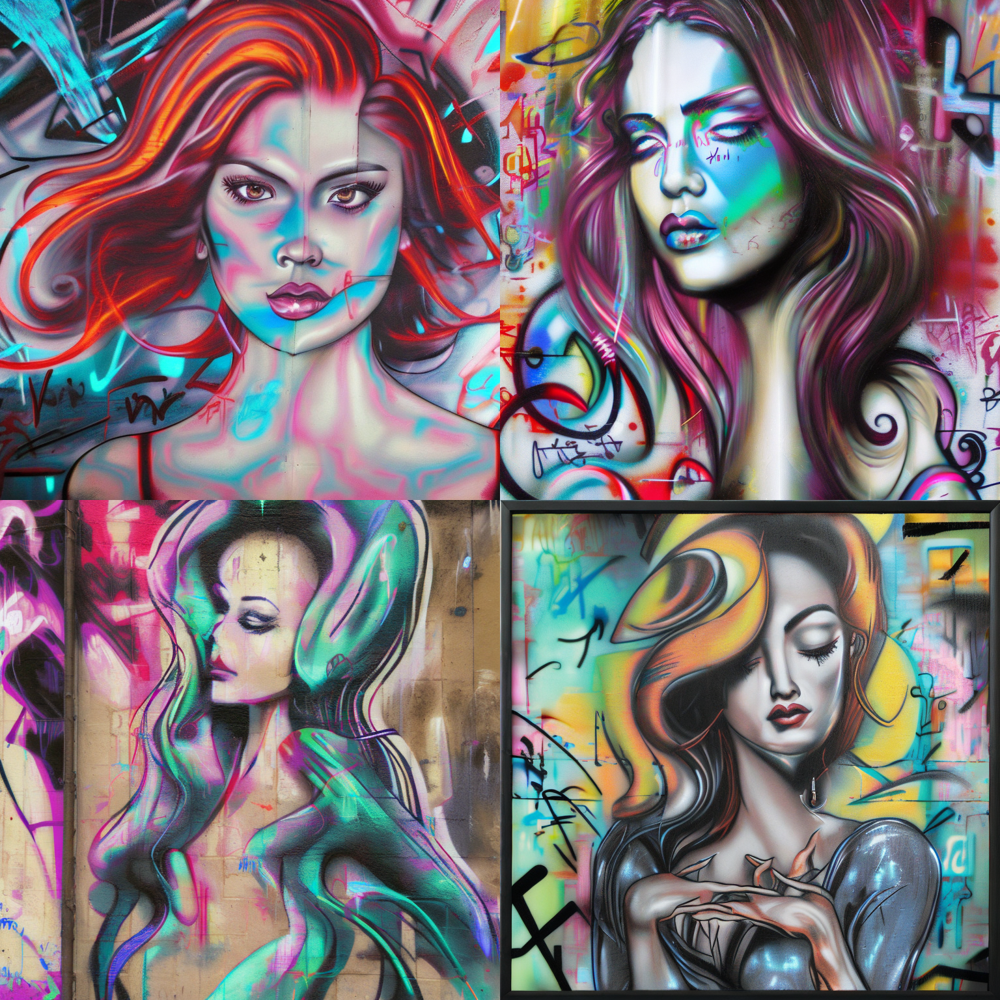

In [ ]:
#@markdown 不要忘记在 prompt 中加上激活词

prompt = "a graffiti on a wall with a beautiful lady  concept art in \u003Cbuhu> style on it" #@param {type:"string"}

num_samples = 2 #@param {type:"number"}
num_rows = 2 #@param {type:"number"}

all_images = []
for _ in range(num_rows):
    images = pipe(prompt, num_images_per_prompt=num_samples, num_inference_steps=50, guidance_scale=7.5).images
    all_images.extend(images)

grid = image_grid(all_images, num_samples, num_rows)
grid

# 使用 civitai 中的概念模型

也可以从 civitai 浏览并下载概念模型

下载模型文件

In [ ]:
!wget https://civitai.com/api/download/models/5469 -O charturnerv2.pt

从本地文件加载概念模型

In [ ]:
pipe15.load_textual_inversion("./charturnerv2.pt")

为了支持更长的 prompt，使用 compel 库

In [ ]:
from compel import Compel
compel = Compel(tokenizer=pipe15.tokenizer, text_encoder=pipe15.text_encoder)

同时使用正向 prompt 和 负向 prompt 控制图片生成。同样需要在 prompt 中包含概念模型的激活词 PlanIt。

这个概念模型会将图片生成为类似概念图、设计图的样子。

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

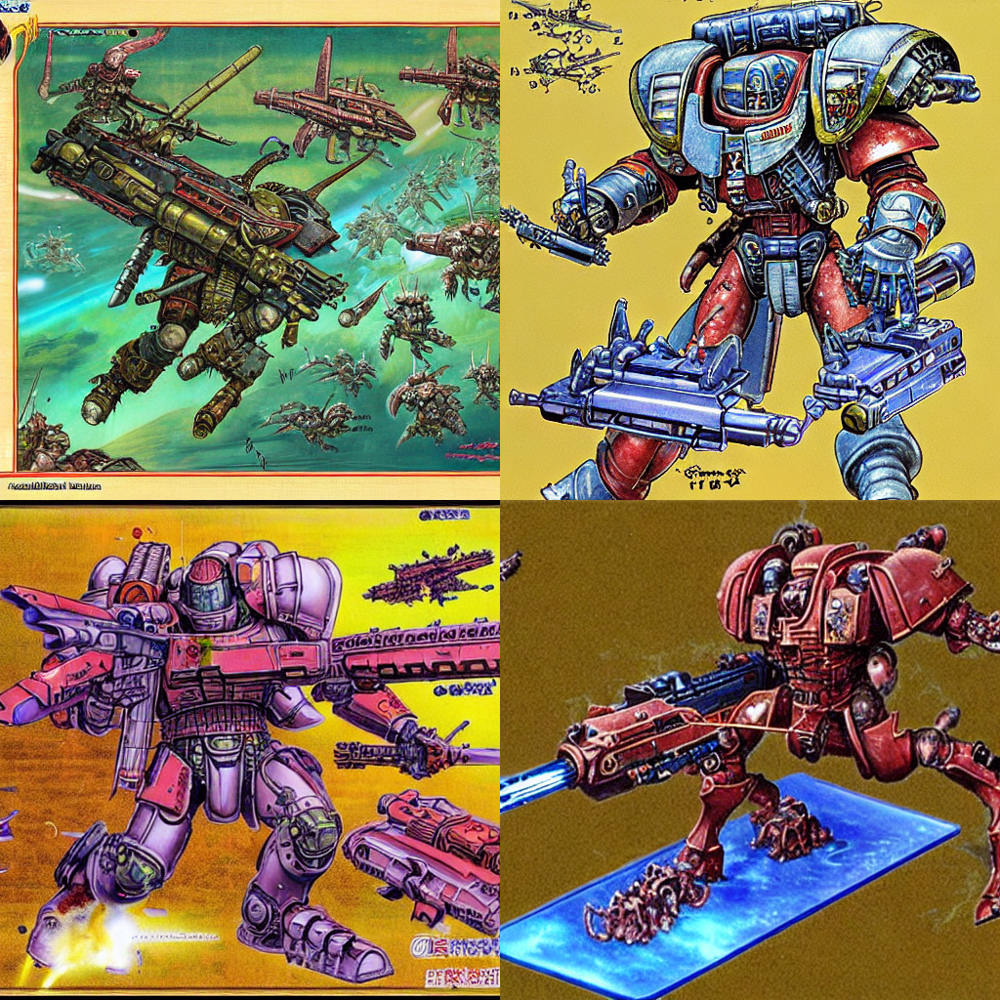

In [ ]:
prompt = "PlanIt, scientific diagram,scientific illustration,concept render,architectural plans,technical illustration,patent diagram,Drawing inspiration from modern masters like Yoshitaka Amano,Katsuya Terada, moebius inspired metal hurlant art In the middle of a chaotic skirmish, a space marine takes a defensive stance, unloading rounds from his boltgun into the advancing alien horde., warhammer 40000, \u003Clora:boltgunxllorav1:0.7>, the contrast in colors and textures should be distinct surreal,highly detailed,vibrant yet slightly desaturated,dramatic lighting,sense of motion,grainy texture,retro-futuristic, deep digital painting layers,fluid watercolor techniques,meticulous detailing,soft ambient lighting, vibrant colors,subtle emotional nuances" #@param {type:"string"}
negative_prompt = "Character, person, woman, man, symmetric, centered, portrait, bland, polished,minimalist,modern,overly bright, monochrome, exaggerated" #@param {type:"string"}

num_samples = 2 #@param {type:"number"}
num_rows = 2 #@param {type:"number"}

all_images = []
for _ in range(num_rows):
    conditioning = compel.build_conditioning_tensor(prompt)
    negative_conditioning = compel.build_conditioning_tensor(negative_prompt)
    [conditioning, negative_conditioning] = compel.pad_conditioning_tensors_to_same_length([conditioning, negative_conditioning])
    images = pipe15(prompt_embeds=conditioning, negative_prompt_embeds=negative_conditioning, num_images_per_prompt=num_samples, num_inference_steps=50, guidance_scale=7.5).images
    all_images.extend(images)

grid = image_grid(all_images, num_samples, num_rows)
grid

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

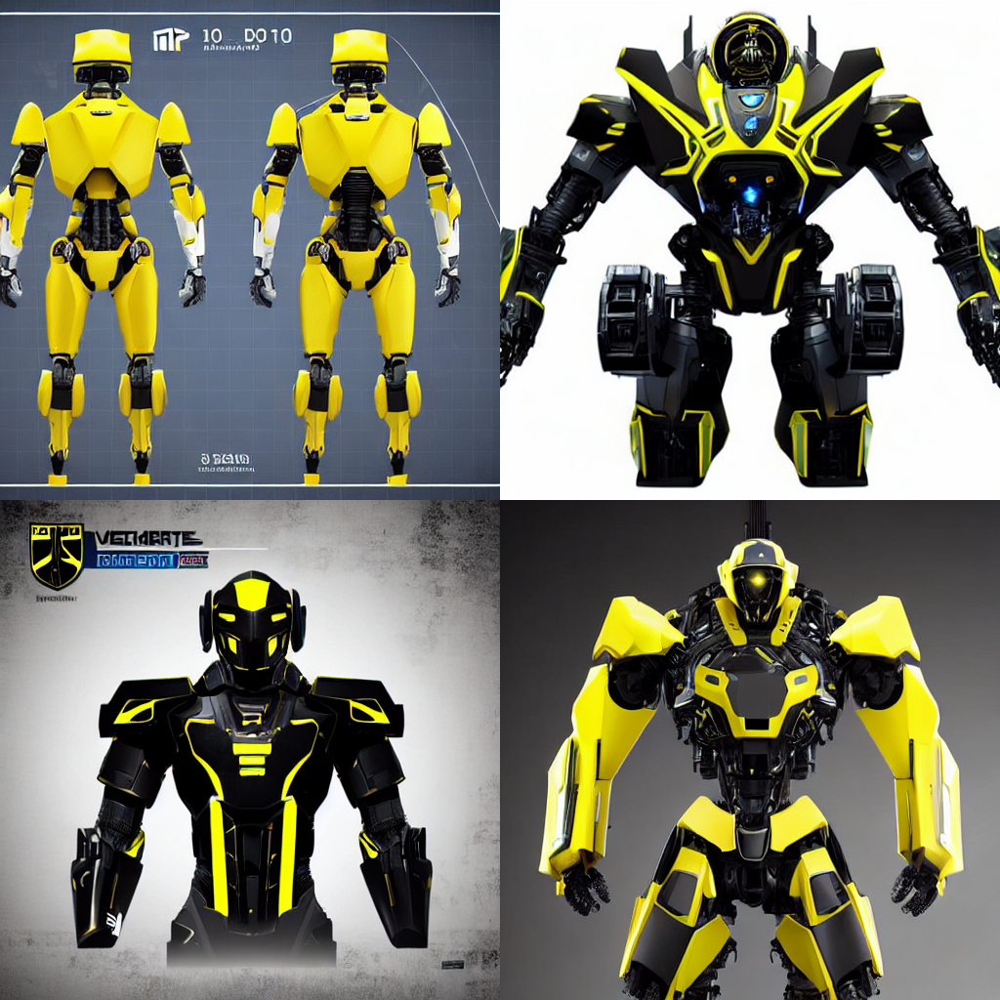

In [ ]:
prompt = "PlanIt, scientific diagram,scientific illustration,concept render,architectural plans,technical illustration,patent diagram,front side, long shot upper body view of extremely detailed and intricate (intimidating:1.2) matte_black and (yellow:0.1) cybermech android, cinematic photo, (((((focus))))), film, professional, 4k, highly detailed" #@param {type:"string"}
negative_prompt = "Character, person, woman, man, drawing, painting, crayon, sketch, graphite, impressionist, noisy, blurry, soft, deformed, ugly, (((((depth of field))))), wrong" #@param {type:"string"}

num_samples = 2 #@param {type:"number"}
num_rows = 2 #@param {type:"number"}

all_images = []
for _ in range(num_rows):
    conditioning = compel.build_conditioning_tensor(prompt)
    negative_conditioning = compel.build_conditioning_tensor(negative_prompt)
    [conditioning, negative_conditioning] = compel.pad_conditioning_tensors_to_same_length([conditioning, negative_conditioning])
    images = pipe15(prompt_embeds=conditioning, negative_prompt_embeds=negative_conditioning, num_images_per_prompt=num_samples, num_inference_steps=50, guidance_scale=7.5).images
    all_images.extend(images)

grid = image_grid(all_images, num_samples, num_rows)
grid

如下概念模型可以生成凌乱房间的图片。

使用激活词 (Clutter-Home:0.5) 将生成稍微凌乱的房间，(Clutter-Home:1.0) 生成凌乱程度更高的房间。

In [ ]:
!wget https://civitai.com/api/download/models/109133 -O clutter.pt
pipe15.load_textual_inversion("./clutter.pt")

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

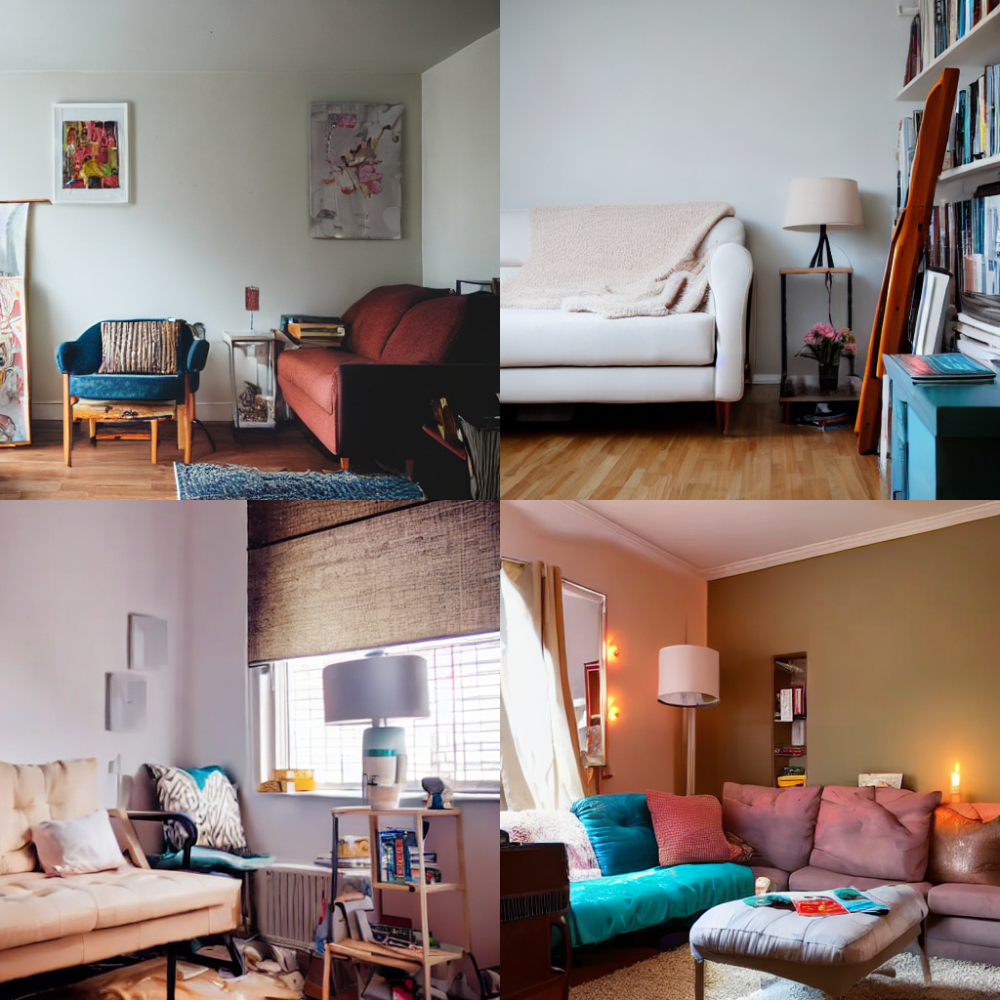

In [36]:
prompt = "(Clutter-Home:0.5), room, bed, book, light, chair, Sofa, Television, Bookshelf, Painting, Mirrors, Candles, Lamp" #@param {type:"string"}
negative_prompt = "" #@param {type:"string"}

num_samples = 2 #@param {type:"number"}
num_rows = 2 #@param {type:"number"}

all_images = []
for _ in range(num_rows):
    conditioning = compel.build_conditioning_tensor(prompt)
    negative_conditioning = compel.build_conditioning_tensor(negative_prompt)
    [conditioning, negative_conditioning] = compel.pad_conditioning_tensors_to_same_length([conditioning, negative_conditioning])
    images = pipe15(prompt_embeds=conditioning, negative_prompt_embeds=negative_conditioning, num_images_per_prompt=num_samples, num_inference_steps=50, guidance_scale=7.5).images
    all_images.extend(images)

grid = image_grid(all_images, num_samples, num_rows)
grid

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

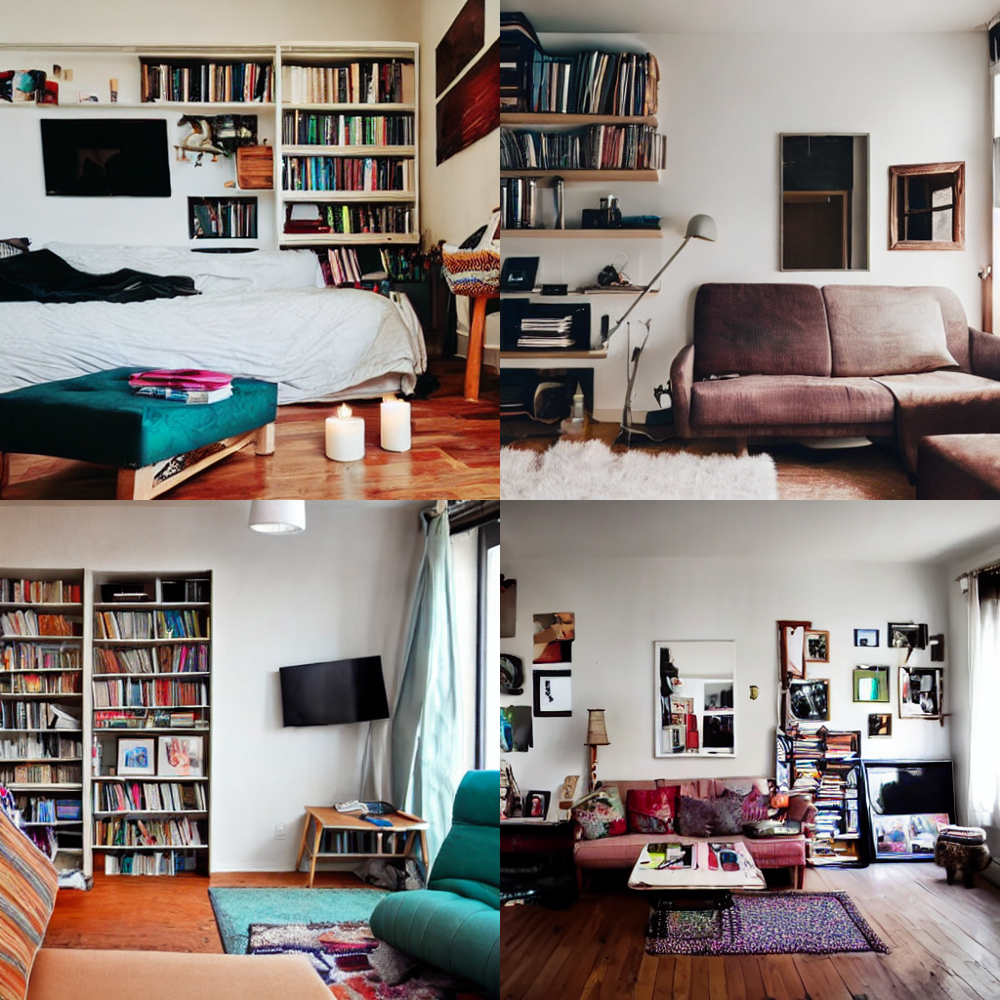

In [41]:
prompt = "(Clutter-Home:1.0), room, bed, book, chair, Sofa, Television, Bookshelf, Painting, Mirrors, Candles, Lamp" #@param {type:"string"}
negative_prompt = "" #@param {type:"string"}

num_samples = 2 #@param {type:"number"}
num_rows = 2 #@param {type:"number"}

all_images = []
for _ in range(num_rows):
    conditioning = compel.build_conditioning_tensor(prompt)
    negative_conditioning = compel.build_conditioning_tensor(negative_prompt)
    [conditioning, negative_conditioning] = compel.pad_conditioning_tensors_to_same_length([conditioning, negative_conditioning])
    images = pipe15(prompt_embeds=conditioning, negative_prompt_embeds=negative_conditioning, num_images_per_prompt=num_samples, num_inference_steps=50, guidance_scale=7.5).images
    all_images.extend(images)

grid = image_grid(all_images, num_samples, num_rows)
grid